# Gradient based optimisation

In [1]:
import torch
from torch import nn
import nussl
import numpy as np
import matplotlib.pyplot as plt
import gif
from IPython.display import display, Image
import tempfile
import copy
import tqdm

nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

def show_gif(frames, duration=5.0, width=600):
    with tempfile.NamedTemporaryFile(suffix='.gif') as f:
        gif.save(frames, f.name, duration=duration)
        with open(f.name,'rb') as f:
            im = Image(data=f.read(), format='png', width=width)
    return im

Single layer nueral net with 1 hidden unit

A line that corresponds to y = mx + b

y = output of network

m and b = learnable parameters

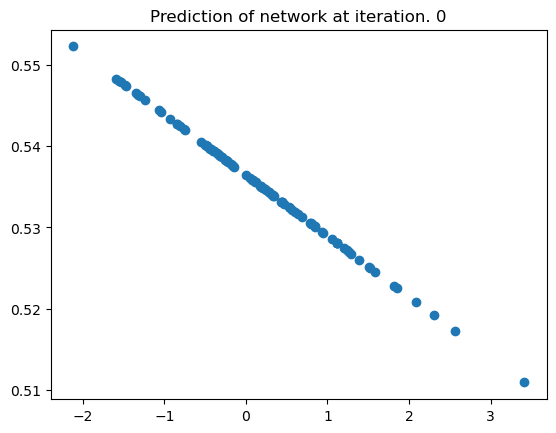

In [2]:
class Line(nn.Module):
    def __init__(self):
        super().__init__()
        self.layer = nn.Linear(1, 1)

    def forward(self, x):
        y = self.layer(x)
        return y
    
line = Line()
x = torch.randn(100, 1)
y = line(x)

plt.title("Prediction of network at iteration. 0")
plt.scatter(to_numpy(x), to_numpy(y))
plt.show()

the magic is hidden in nn.Linear

pytorch initializes a single network layer with one hidden unit (m) and a bias (b)

In [3]:
for n, p in line.named_parameters():
    print(n, p)

layer.weight Parameter containing:
tensor([[-0.0075]], requires_grad=True)
layer.bias Parameter containing:
tensor([0.5364], requires_grad=True)


Make some training data 

Training data will be a line with of some slope with some bias, plus a bit of random noise with a mean of 0 and standard deviation 𝜎

𝑦=𝑚𝑥+𝑏+N(0,𝜎)

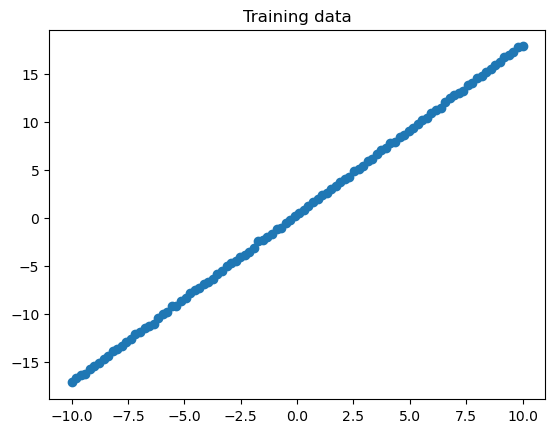

In [4]:
m = np.random.randn()
b = np.random.randn()
x = np.linspace(-10, 10, 100)
noise = np.random.normal(loc=0, scale=0.1, size=100)

y = m*x + b + noise

plt.title("Training data")
plt.scatter(x, y)
plt.show()

look at what our network does on this data, overlaid with the actual training data:

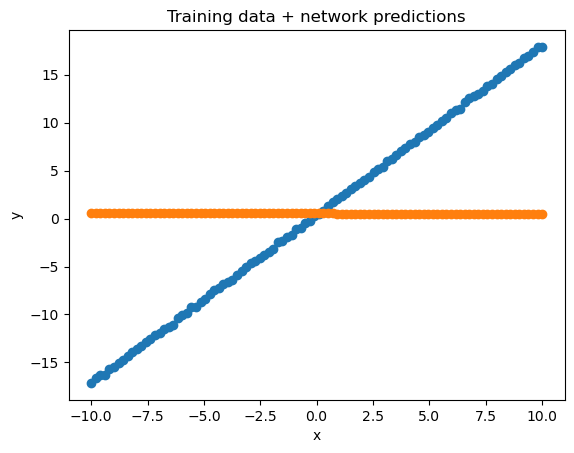

In [5]:
y_hat = line(to_tensor(x))

plt.title("Training data + network predictions")
plt.scatter(x, y, label='Training data')
plt.scatter(x, to_numpy(y_hat), label='Network predictions')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

# loss functions

How is our network doing?

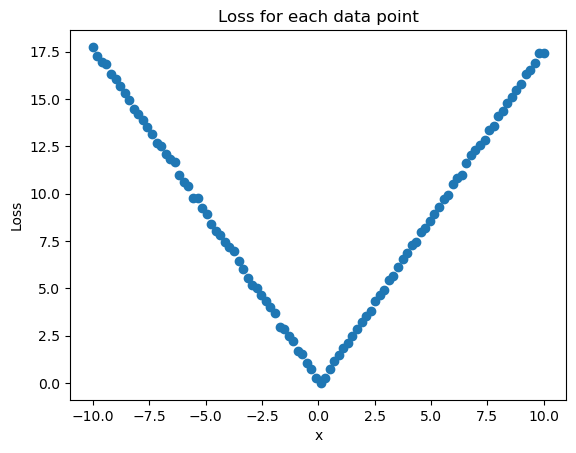

In [6]:
loss = (y_hat - to_tensor(y)).abs()
plt.title("Loss for each data point")
plt.scatter(x, to_numpy(loss))
plt.ylabel("Loss")
plt.xlabel("x")
plt.show()

Above is the loss for every datapoint

In [7]:
loss.mean()

tensor(8.9430, grad_fn=<MeanBackward0>)

The mean stays in the same range no matter how matter how many data points you compute the loss over, unlike the sum. 

# Brute force approach 

Niave way! Guessing the optimum parameters

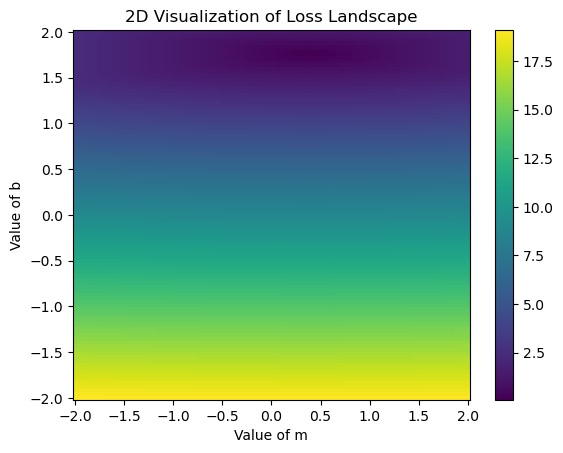

In [8]:
possible_m = np.linspace(-2, 2, 100)
possible_b = np.linspace(-2, 2, 100)
loss = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))

with torch.no_grad():
    for i, m_hat in enumerate(possible_m):
        for j, b_hat in enumerate(possible_b):
            line.layer.weight[0, 0] = m_hat
            line.layer.bias[0] = b_hat
            y_hat = line(to_tensor(x))
            _loss = (y_hat - to_tensor(y)).abs().mean()
            loss[i, j] = _loss

plt.title('2D Visualization of Loss Landscape')
plt.pcolormesh(possible_m, possible_b, loss, shading='auto')
plt.colorbar()
plt.xlabel('Value of m')
plt.ylabel('Value of b')
plt.show()

In [9]:
idx = np.unravel_index(np.argmin(loss, axis=None), loss.shape)
m_hat = possible_m[idx[0]]
b_hat = possible_b[idx[1]]

print(f"Loss minimum of {loss.min():-2f} at \n\t m_hat={m_hat:0.2f}, b_hat={b_hat:-.2f}")
print(f"Actual m, b: \n\t m={m:.2f}, b={b:.2f}")

Loss minimum of 0.086866 at 
	 m_hat=1.76, b_hat=0.38
Actual m, b: 
	 m=1.76, b=0.40


What network predictions look like 

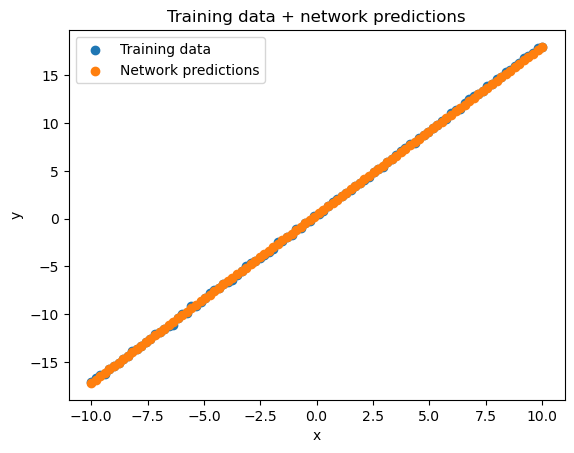

In [10]:
with torch.no_grad():
    line.layer.weight[0, 0] = m_hat
    line.layer.bias[0] = b_hat

    y_hat = line(to_tensor(x))

plt.title("Training data + network predictions")
plt.scatter(x, y, label='Training data')
plt.scatter(x, to_numpy(y_hat), label='Network predictions')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# Gradient descent 

look at the local loss landscape - where we are now and the points that we could go to around us.

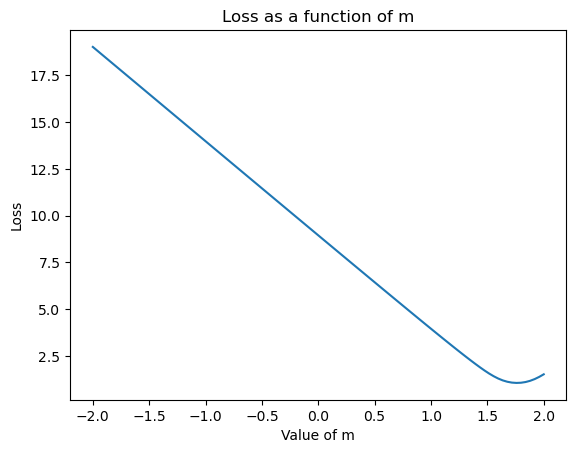

In [11]:
plt.plot(possible_m, loss.mean(axis=1))
plt.xlabel('Value of m')
plt.ylabel('Loss')
plt.title('Loss as a function of m')
plt.show()

Look at how b changes 

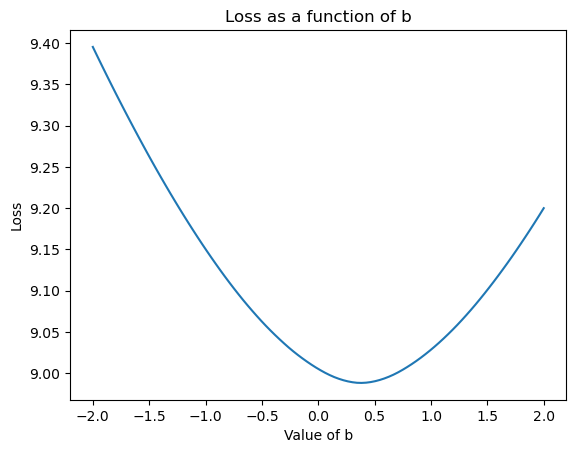

In [12]:
plt.plot(possible_b, loss.mean(axis=0))
plt.xlabel('Value of b')
plt.ylabel('Loss')
plt.title('Loss as a function of b')
plt.show()

To compute the gradients with pytorch, just compute the loss and then call backward() on it.

In [13]:
line = Line()
with torch.no_grad():
    line.layer.weight[0, 0] = m_hat
    line.layer.bias[0] = b_hat

y_hat = line(to_tensor(x))
_loss = (y_hat - to_tensor(y)).abs().mean()
_loss.backward()

line.layer.weight.grad, line.layer.bias.grad

(tensor([[-0.8747]]), tensor([-0.1000]))

Look at the gradients as m and b change 

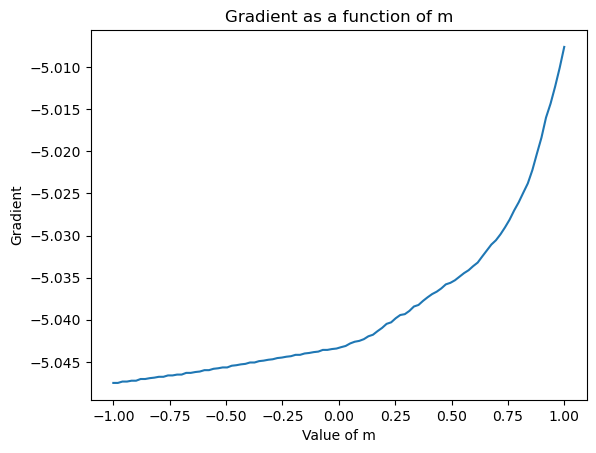

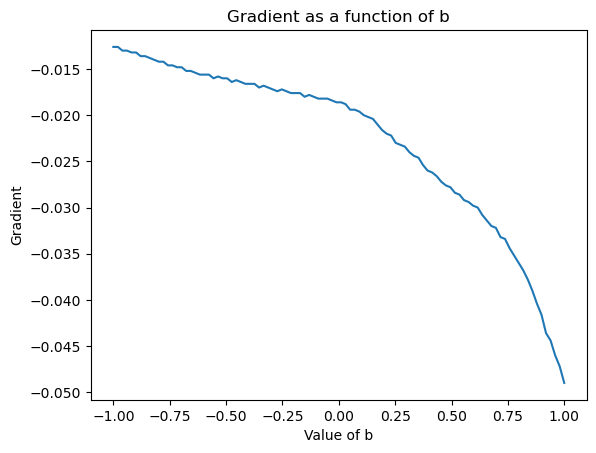

In [14]:
possible_m = np.linspace(-1, 1, 100)
possible_b = np.linspace(-1, 1, 100)
grad_m = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))
grad_b = np.empty((
    possible_m.shape[0], 
    possible_b.shape[0]
))

for i, m_hat in enumerate(possible_m):
    for j, b_hat in enumerate(possible_b):
        line = Line()
        with torch.no_grad():
            line.layer.weight[0, 0] = m_hat
            line.layer.bias[0] = b_hat
        y_hat = line(to_tensor(x))
        _loss = (y_hat - to_tensor(y)).abs().mean()
        _loss.backward()
        
        grad_m[i, j] = line.layer.weight.grad.item()
        grad_b[i, j] = line.layer.bias.grad.item()

plt.plot(possible_m, grad_m.mean(axis=1))
plt.xlabel('Value of m')
plt.ylabel('Gradient')
plt.title('Gradient as a function of m')
plt.show()

plt.plot(possible_b, grad_b.mean(axis=1))
plt.xlabel('Value of b')
plt.ylabel('Gradient')
plt.title('Gradient as a function of b')
plt.show()

Put it all together:

1. Compute the gradient for the current network parameters 𝑚̂  and 𝑏̂ .

2. Go in the opposite direction of the gradient by some fixed amount.

3. Go back to 1.



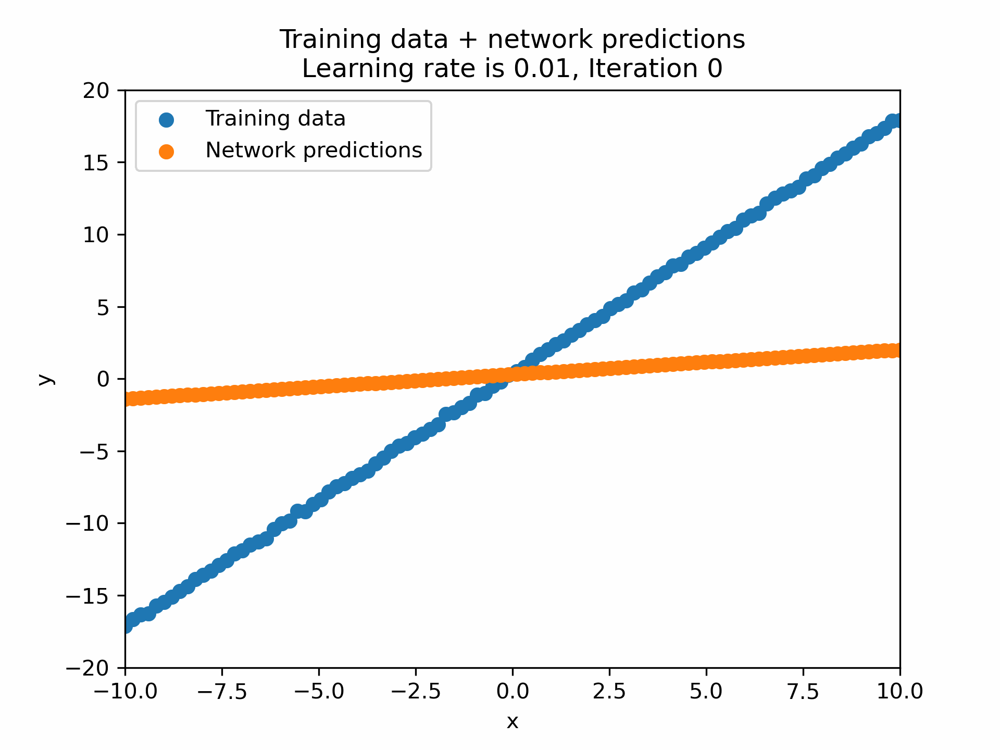

In [15]:
N_ITER=100
LEARNING_RATE = 0.01
# initialize line
line = Line()

frames = []
@gif.frame
def plot(i):
    y_hat = line(to_tensor(x))
    plt.figure(dpi=300)
    plt.title(
        f"Training data + network predictions\n"
        f"Learning rate is {LEARNING_RATE}, Iteration {i}")

    plt.scatter(x, y, label='Training data')
    plt.scatter(x, to_numpy(y_hat), label='Network predictions')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.xlim([-10, 10])
    plt.ylim([-20, 20])
    plt.legend()

for i in range(N_ITER):
    line.zero_grad()
    y_hat = line(to_tensor(x))
    _loss = (y_hat - to_tensor(y)).abs().mean()
    _loss.backward()
    
    for n, p in line.named_parameters():
        p.data += - LEARNING_RATE * p.grad
    
    frame = plot(i)
    frames.append(frame)

show_gif(frames)

# Impact of learning rate 

The learning rate controls how big of a step you take in the direction away from the gradient.

Trying multiple learning rate values

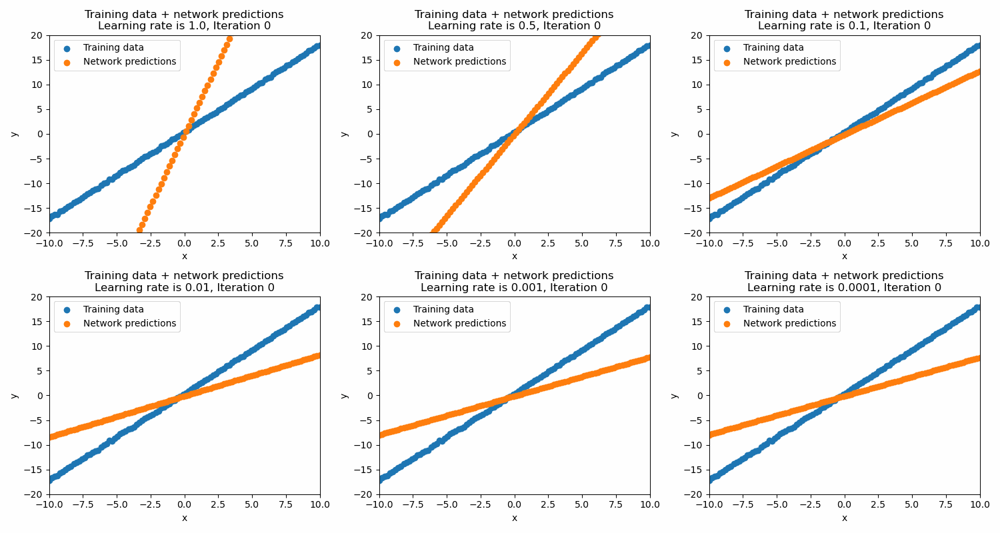

In [16]:
N_ITER=100
LEARNING_RATES = [1.0, 0.5, 0.1, 0.01, 0.001, 0.0001]

line = Line()
lines = [copy.deepcopy(line) for _ in LEARNING_RATES]

losses = [[] for _ in range(len(LEARNING_RATES))]
grad_norms = [[] for _ in range(len(LEARNING_RATES))]

frames = []
@gif.frame
def plot(i, lines):
    ncols = 3
    nrows = len(LEARNING_RATES) // ncols
    width = ncols * 5
    height = nrows * 4
    fig, axs = plt.subplots(nrows, ncols, dpi=100, figsize=(width, height))
    axs = axs.flatten()
    
    for j, line in enumerate(lines):
        y_hat = line(to_tensor(x))
        axs[j].set_title(
            f"Training data + network predictions\n"
            f"Learning rate is {LEARNING_RATES[j]}, Iteration {i}")
        axs[j].scatter(x, y, label='Training data')
        axs[j].scatter(x, to_numpy(y_hat), label='Network predictions')
        axs[j].set_xlabel('x')
        axs[j].set_ylabel('y')
        axs[j].legend()
        axs[j].set_xlim([-10, 10])
        axs[j].set_ylim([-20, 20])
        
    plt.tight_layout()

for i in range(N_ITER):
    for j, line in enumerate(lines):
        line.zero_grad()
        y_hat = line(to_tensor(x))
        _loss = (y_hat - to_tensor(y)).abs().mean()
        losses[j].append(_loss)
        _loss.backward()
        
        grad_norm = 0
        for n, p in line.named_parameters():
            p.data += - LEARNING_RATES[j] * p.grad
            grad_norm += (p.grad.sum() ** 2)
        grad_norm = grad_norm.sqrt().item()
        grad_norms[j].append(grad_norm)

    frame = plot(i, lines)
    frames.append(frame)

show_gif(frames, width=1200)

# Signs of healthy training 

Monitor: 

- Training Validation and loss
- The gradient norm 

Use these to determine whether the learning rate is too high or low, opr whether different optimization algorithms should be used

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

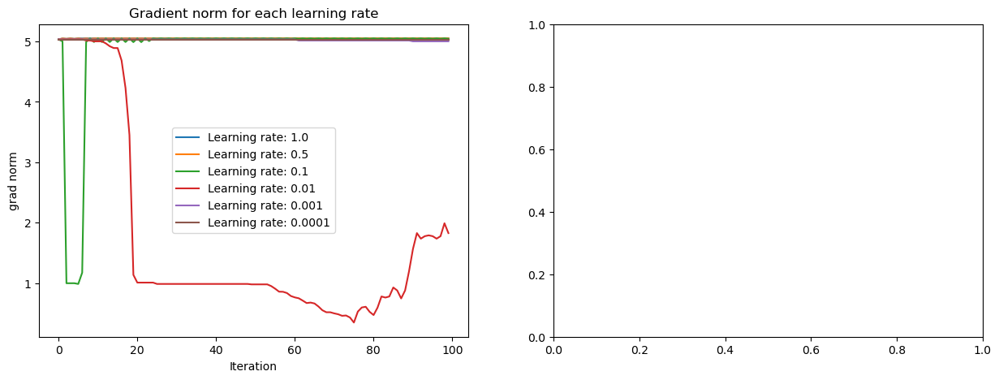

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

for j, lr in enumerate(LEARNING_RATES):
    ax[0].plot(grad_norms[j], label=f'Learning rate: {lr}')
    ax[0].legend()
    ax[0].set_xlabel('Iteration')
    ax[0].set_ylabel('grad norm')
    ax[0].set_title('Gradient norm for each learning rate')
    
for j, lr in enumerate(LEARNING_RATES):
    ax[1].plot(np.log10(losses[j]), label=f'Learning rate: {lr}')
    ax[1].legend()
    ax[1].set_xlabel('Iteration')
    ax[1].set_ylabel('log(loss)')
    ax[1].set_title('Loss for each learning rate')
plt.show()

# What to use for audio source seperation

Good Initial Optimizer setup:
- ADAM optimizer 
- Learning rate = 1e-3
- 𝛽1  = .9, 𝛽2 = .999

Pytorch defaults

### Gradient clipping

Will smooth out noisy loss landscapes if the gradient norm exceeds a certain threshold. it is then renormalized such that the norm of the gradient is equal to that threshold